In [1]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
%matplotlib inline

In [3]:
import sys
sys.path.insert(0,"../python")

In [53]:
# set directories
outdir = "../fcr_figures_early"
basedir = "/scratch/gpfs/changgoo/tigress_classic/"

In [5]:
# model initialization
model_name = {
    "crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst": "crmhd",
    "physics_crmhd-int_rk2-xo_2-ia_false-fbin_0.0-fgas_0.7-beta_1-MHDBC_diode-CRBC_lngrad_out-shear_false-8pc-fe05": "crmhd-fcr0.05",
}

model_color = {
    "crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst": "#E77500",
    "physics_crmhd-int_rk2-xo_2-ia_false-fbin_0.0-fgas_0.7-beta_1-MHDBC_diode-CRBC_lngrad_out-shear_false-8pc-fe05": "#0F4D92",
}

In [50]:
from cr_zprof import cr_data_load, load_group, load_windpdf, load_velocity_pdfs, load_kappa_pdfs

In [7]:
model_dict = cr_data_load(basedir)

Available models in /scratch/gpfs/changgoo/tigress_classic/:
  - crmhd-16pc-b1-diode-diode-sigma_selfc-Vmax2
  - crmhd-16pc-b1-diode-diode-sigma_selfc-Vmax2-tall
  - crmhd-16pc-b1-diode-lngrad_out-sigma_selfc-Vmax2
  - crmhd-16pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-tall
  - crmhd-16pc-b1-lngrad_out-lngrad_out-sigma_selfc-Vmax2
  - crmhd-16pc-b1-lngrad_out-lngrad_out-sigma_selfc-Vmax2-tall
  - crmhd-8pc-b0.1-diode-lngrad_out-sigma_selfc-Vmax2
  - crmhd-8pc-b1-diode-lngrad_out-sigma27_va1
  - crmhd-8pc-b1-diode-lngrad_out-sigma28_va-1
  - crmhd-8pc-b1-diode-lngrad_out-sigma28_va0
  - crmhd-8pc-b1-diode-lngrad_out-sigma28_va1
  - crmhd-8pc-b1-diode-lngrad_out-sigma29_va-1
  - crmhd-8pc-b1-diode-lngrad_out-sigma29_va0
  - crmhd-8pc-b1-diode-lngrad_out-sigma29_va1
  - crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax10
  - crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax10-rst2
  - crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2
  - crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst
  - crmhd

In [8]:
from load_sim_tigresspp import LoadSimTIGRESSPPAll

In [9]:
# load simulations
sa = LoadSimTIGRESSPPAll(model_dict)
simgroup = dict()
group = "fcr"
simgroup[group] = {m: sa.set_model(m, verbose=True) for m in model_name}
sims = simgroup[group]

[LoadSimTIGRESSPP-INFO] basedir: /scratch/gpfs/changgoo/tigress_classic/crmhd-8pc-b1-mhdbc_diode-crbc_lngrad_out-sigma_selfc-Vmax2-rst
[LoadSimTIGRESSPP-INFO] savdir: /scratch/gpfs/changgoo/tigress_classic/crmhd-8pc-b1-mhdbc_diode-crbc_lngrad_out-sigma_selfc-Vmax2-rst
[LoadSimTIGRESSPP-INFO] load_method: xarray
[FindFiles-INFO] athinput: /scratch/gpfs/changgoo/tigress_classic/crmhd-8pc-b1-mhdbc_diode-crbc_lngrad_out-sigma_selfc-Vmax2-rst/athinput.runtime
[FindFiles-INFO] athena_variant: Athena++
[FindFiles-INFO] problem_id: TIGRESS
[FindFiles-INFO] hdf5 (prim): /scratch/gpfs/changgoo/tigress_classic/crmhd-8pc-b1-mhdbc_diode-crbc_lngrad_out-sigma_selfc-Vmax2-rst nums: 201-600
[FindFiles-INFO] hdf5 (uov): /scratch/gpfs/changgoo/tigress_classic/crmhd-8pc-b1-mhdbc_diode-crbc_lngrad_out-sigma_selfc-Vmax2-rst nums: 21-60
[FindFiles-INFO] parbin (par0): /scratch/gpfs/changgoo/tigress_classic/crmhd-8pc-b1-mhdbc_diode-crbc_lngrad_out-sigma_selfc-Vmax2-rst nums: 201-600
[FindFiles-INFO] parhst: 

In [10]:
# load data
load_group(simgroup, group)

loading crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst...


[LoadSimTIGRESSPP-INFO] Read from existing netcdf: /scratch/gpfs/changgoo/tigress_classic/crmhd-8pc-b1-mhdbc_diode-crbc_lngrad_out-sigma_selfc-Vmax2-rst/merged_zprof/merged_zprof.nc
[LoadSimTIGRESSPP-INFO] [read_hst]: Reading pickle.


loading physics_crmhd-int_rk2-xo_2-ia_false-fbin_0.0-fgas_0.7-beta_1-MHDBC_diode-CRBC_lngrad_out-shear_false-8pc-fe05...


[LoadSimTIGRESSPP-INFO] Read from existing netcdf: /scratch/gpfs/changgoo/tigress_classic/physics_crmhd-int_rk2-xo_2-ia_false-fbin_0.0-fgas_0.7-beta_1-MHDBC_diode-CRBC_lngrad_out-shear_false-8pc-fe05/merged_zprof/merged_zprof.nc
[LoadSimTIGRESSPP-INFO] [read_hst]: Reading pickle.


In [11]:
mlist = list(model_name.keys())

In [54]:
for m, s in sims.items():
    s.tslice = slice(200,500)
    # zp = s.load_zprof_postproc()
    load_windpdf(s, both=True)
    # load_velocity_pdfs(s)

In [30]:
# s = sims[mlist[1]]
# s.tslice=slice(400,700)

In [55]:
import plotting_scripts as ps
# setup for plotting scripts
ps.setup(outdir, model_name, model_color)

crmhd sfr40 0.003618401188045792 0.0010432405710473064
crmhd-fcr0.05 sfr40 0.0036461380951009156 0.0007995182563547985
crmhd Sigma_gas 7.856706284548293 10.46718815489521
crmhd-fcr0.05 Sigma_gas 8.629173434917666 10.712954931691304
crmhd Sigma_out 0.8138583323846769 2.3678779846034477
crmhd-fcr0.05 Sigma_out 0.46147972035522805 1.5031798933527458


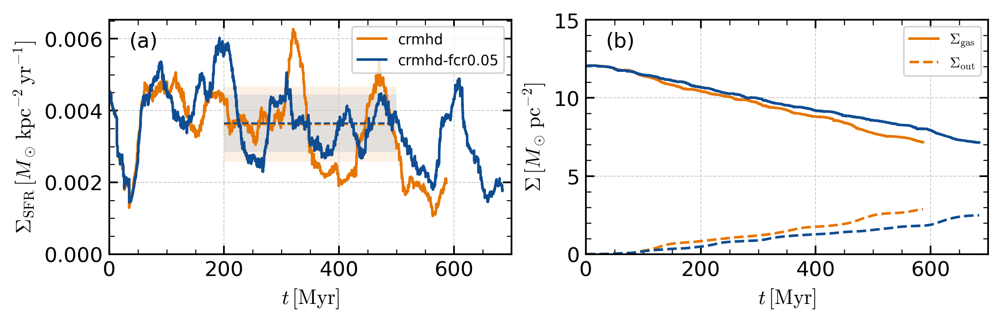

In [56]:
fig = ps.plot_history(simgroup, group, tmax=700)

crmhd Pok_cr 11417.381660361032 1536.3784188417883
crmhd Pok_th 3878.1466238465796 1042.4113032996215
crmhd Pok_kin 13948.027285816841 5528.363712180743
crmhd Pi_B 1315.8001677127427 741.5901782631819
crmhd-fcr0.05 Pok_cr 7789.318391723708 1462.34012125018
crmhd-fcr0.05 Pok_th 3754.236430243667 762.008972447826
crmhd-fcr0.05 Pok_kin 15417.546824770581 5426.133074021324
crmhd-fcr0.05 Pi_B 1743.1343064128894 842.5661643670975
crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst 823.6805259587672 252.47594441102325
crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst rho: P0=1.83e+00, H=0.199 kpc
crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst Pok_cr: P0=1.44e+04, H=3.951 kpc
crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst Pok_th: P0=4.32e+03, H=0.320 kpc
crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst Pok_kin: P0=1.40e+04, H=0.482 kpc
crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst Pi_B: P0=1.40e+03, H=0.175 kpc
physics_crmhd-int_rk2-xo_2-ia_false-fbin_0.0-fgas_0.7-beta_1-M

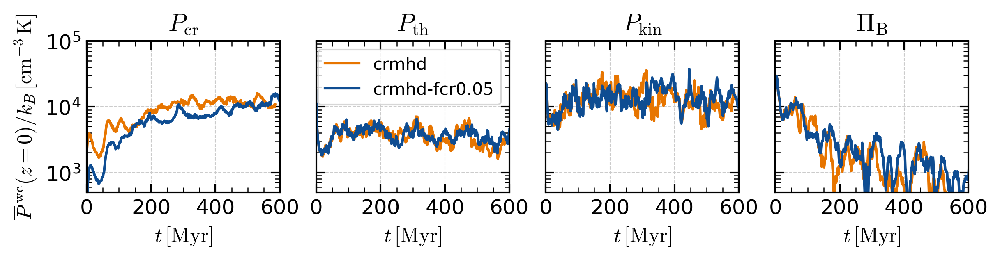

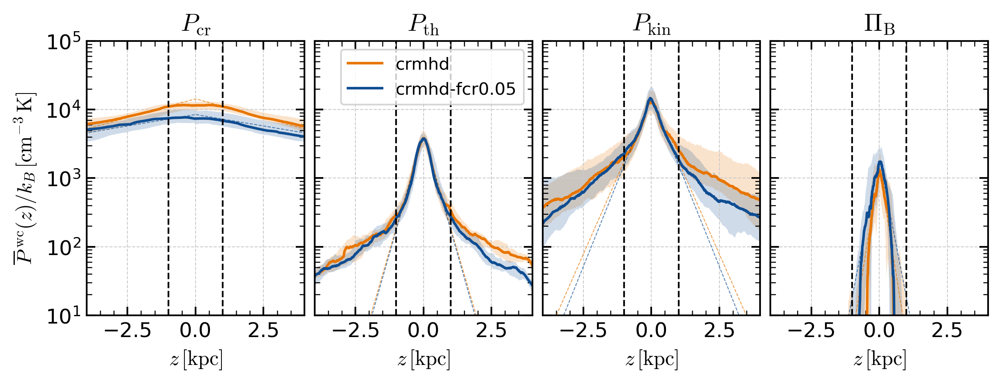

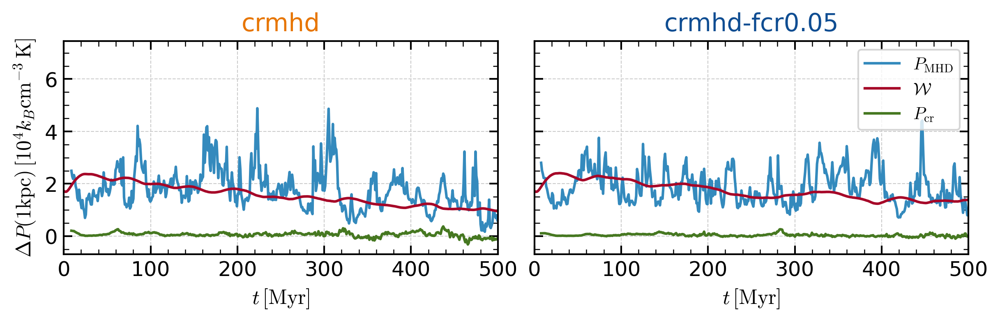

In [57]:
zslice = slice(-50, 50)
f=ps.plot_pressure_t(simgroup, group, zslice=zslice)
f=ps.plot_pressure_z(simgroup, group)
f=ps.plot_vertical_equilibrium_t(simgroup, group, zmax=1000)

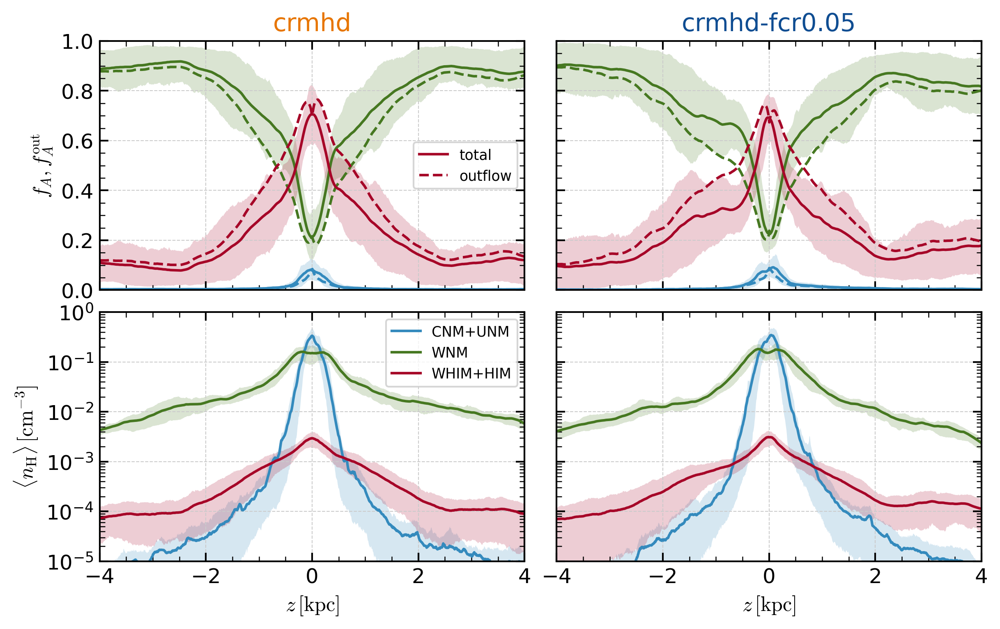

In [58]:
f=ps.plot_area_mass_fraction_z(simgroup, group)

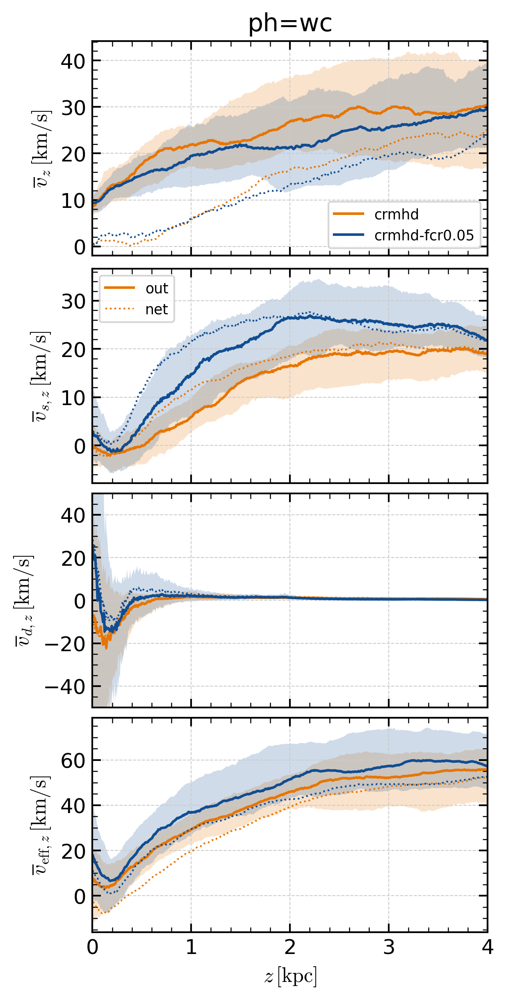

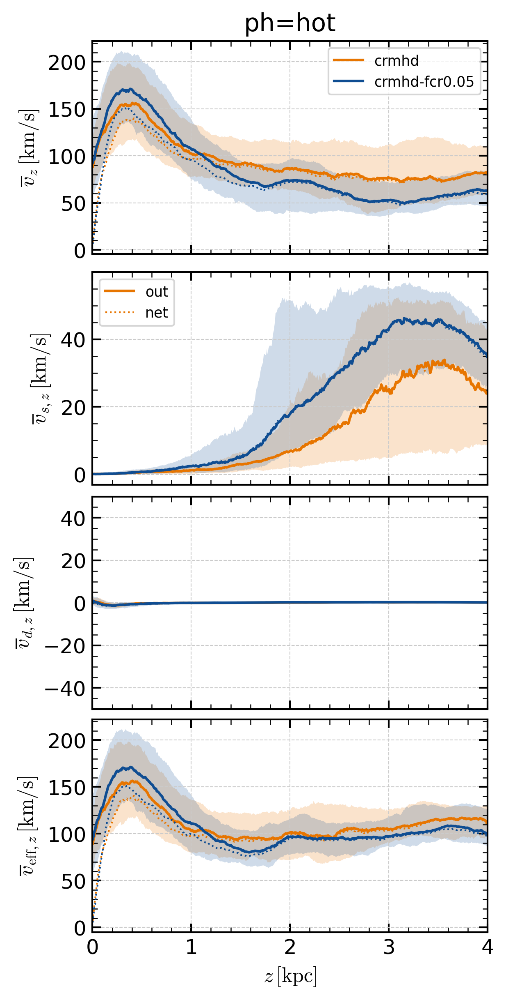

In [59]:
f=ps.plot_velocity_z(simgroup, group, ph="wc")
f=ps.plot_velocity_z(simgroup, group, ph="hot")

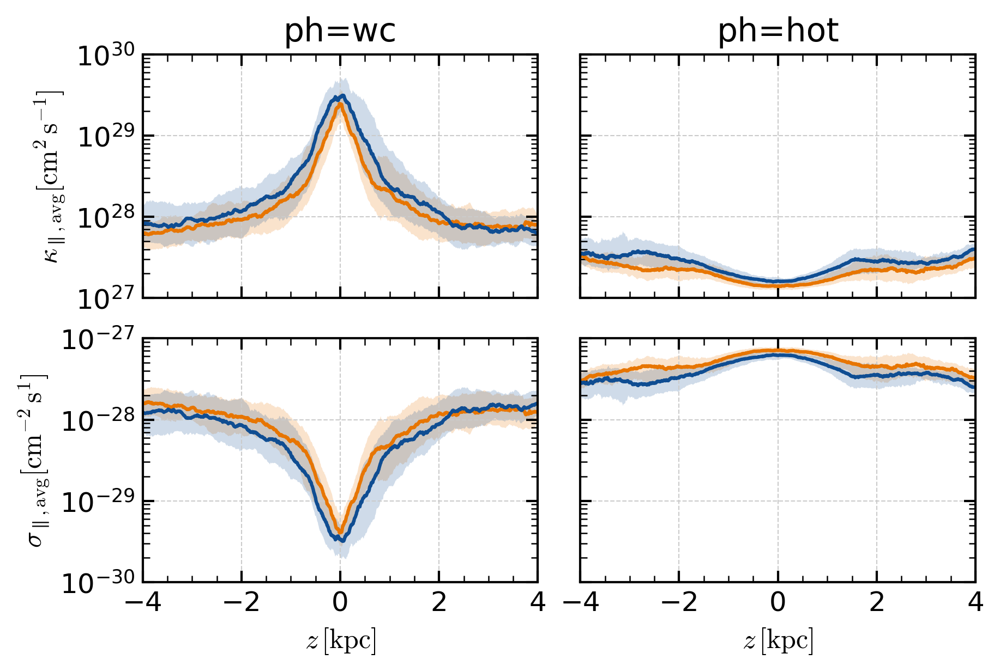

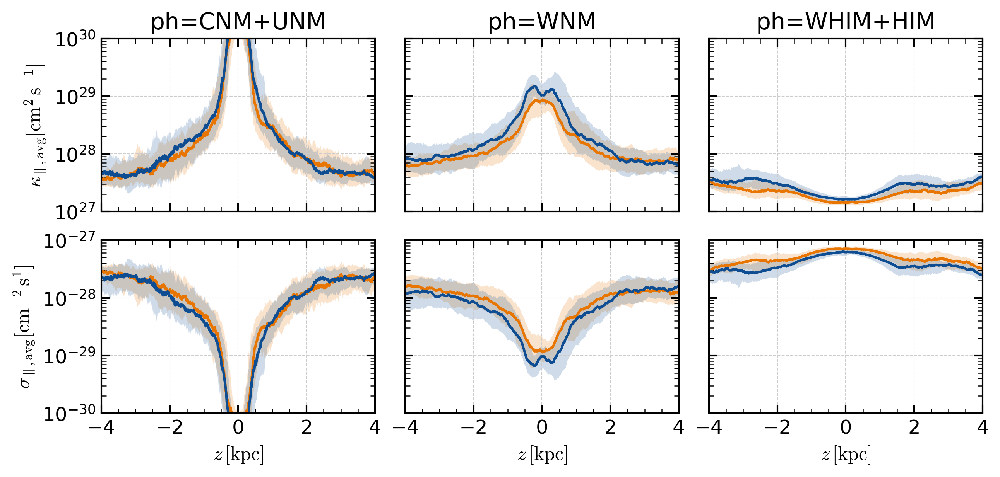

In [60]:
f=ps.plot_kappa_z(simgroup, group)
f=ps.plot_kappa_z(
    simgroup,
    group,
    phases=[["CNM", "UNM"], "WNM", ["WHIM", "HIM"]]
)

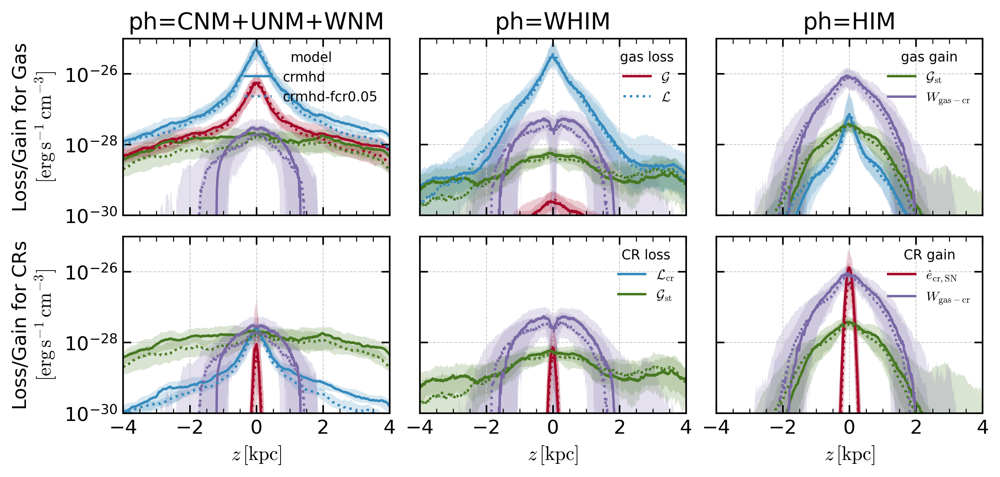

In [61]:
f=ps.plot_gainloss_z(
    simgroup,
    group,
    phases=[["CNM", "UNM", "WNM"], "WHIM", "HIM"],
)

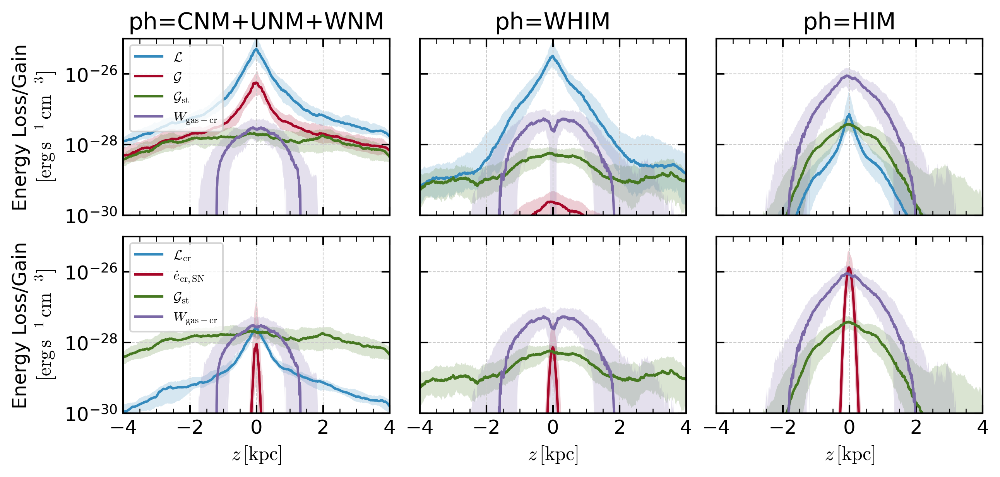

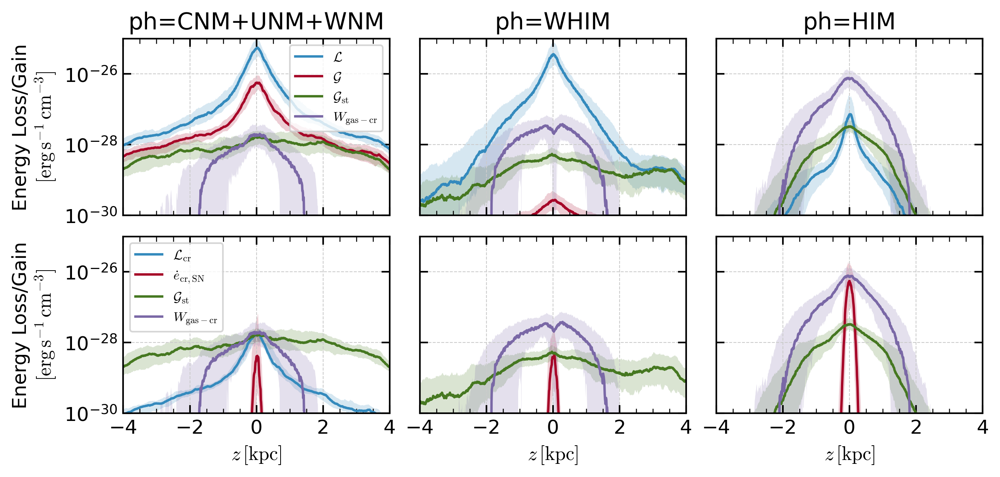

In [62]:
model_list = list(model_name.keys())
for m in model_list:
    s = sims[m]
    f=ps.plot_gainloss_z_each(
        s,
        m,
        phases=[["CNM", "UNM", "WNM"], "WHIM", "HIM"],
    )

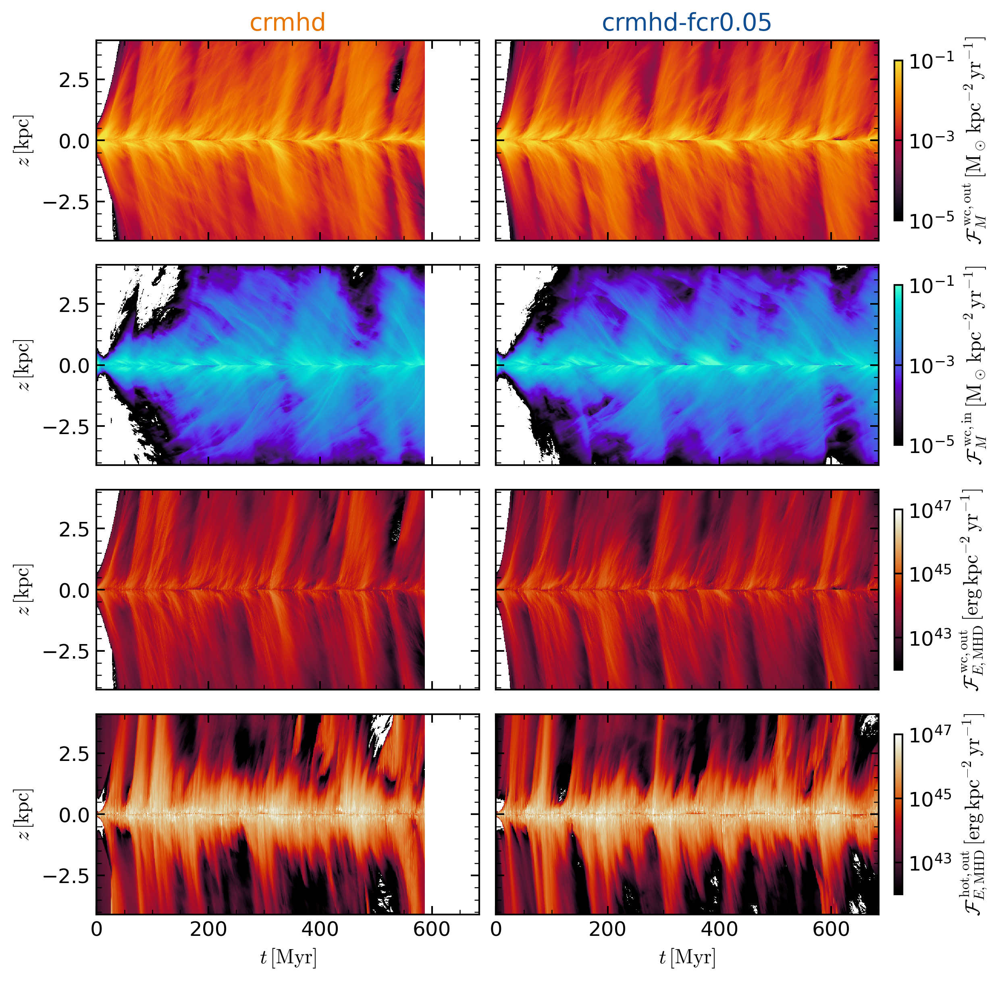

In [63]:
f=ps.plot_flux_tz(simgroup, group)

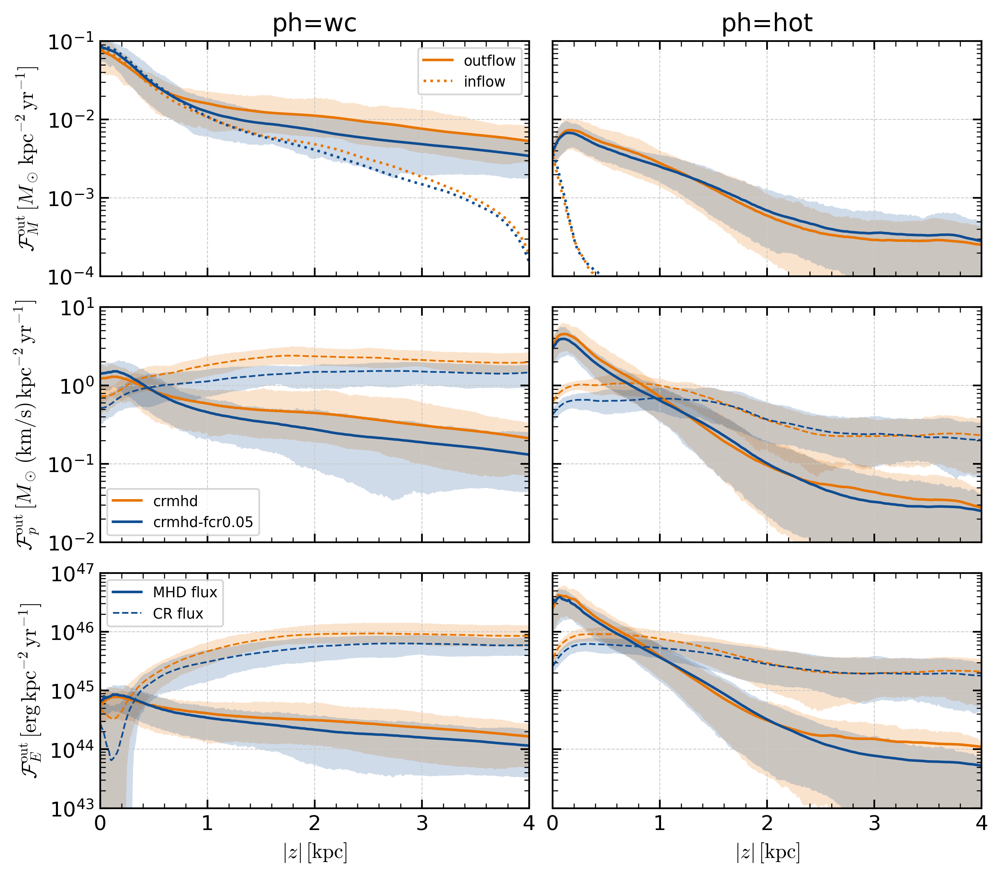

In [64]:
f=ps.plot_flux_z(simgroup, group, vz_dir=1, both=True)

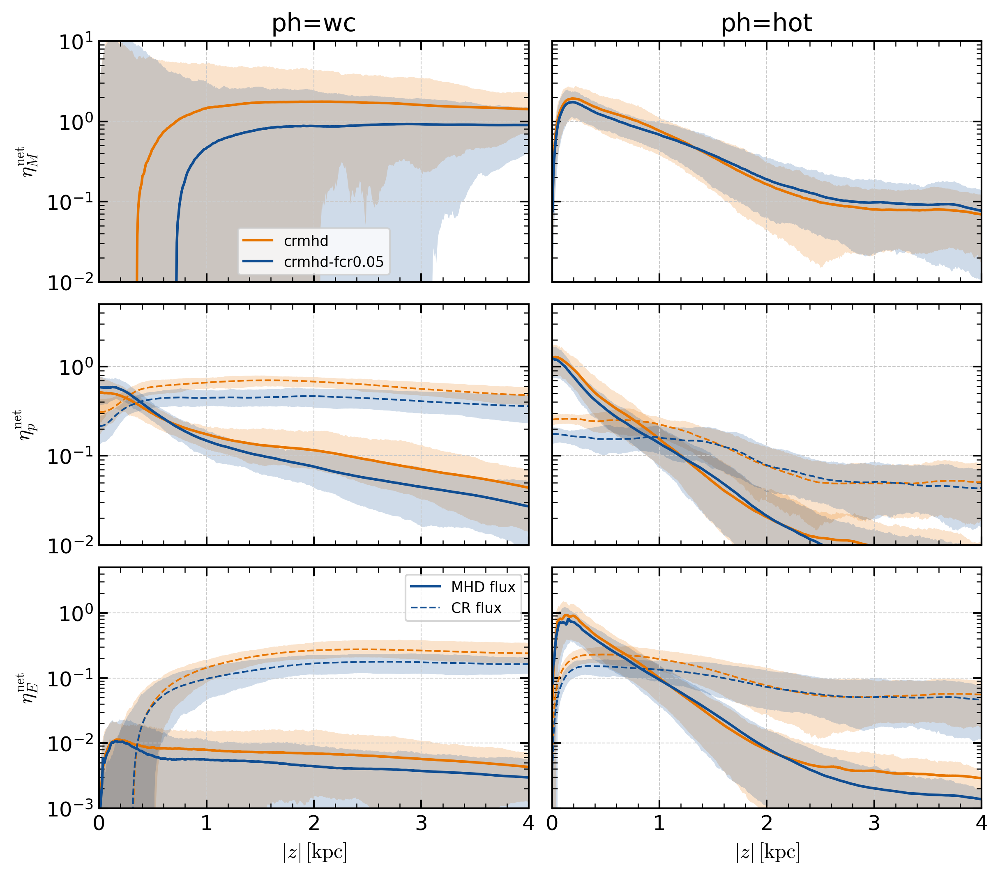

In [65]:
f=ps.plot_loading_z(simgroup, group, vz_dir=None, both=True)

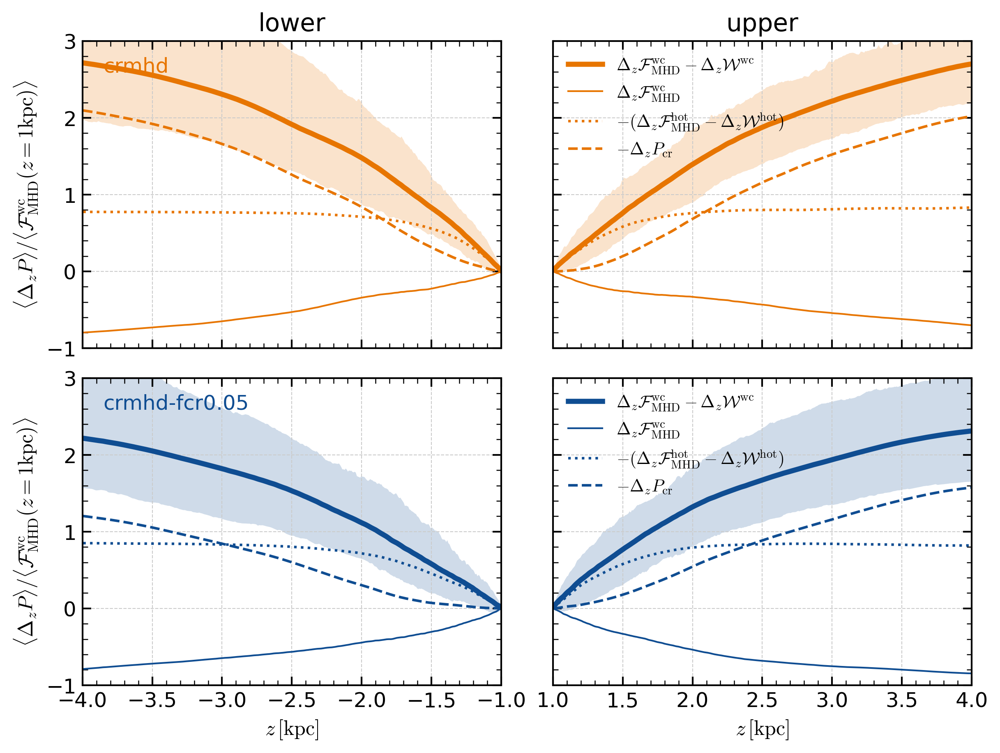

In [66]:
f=ps.plot_momentum_transfer_z(simgroup, group)

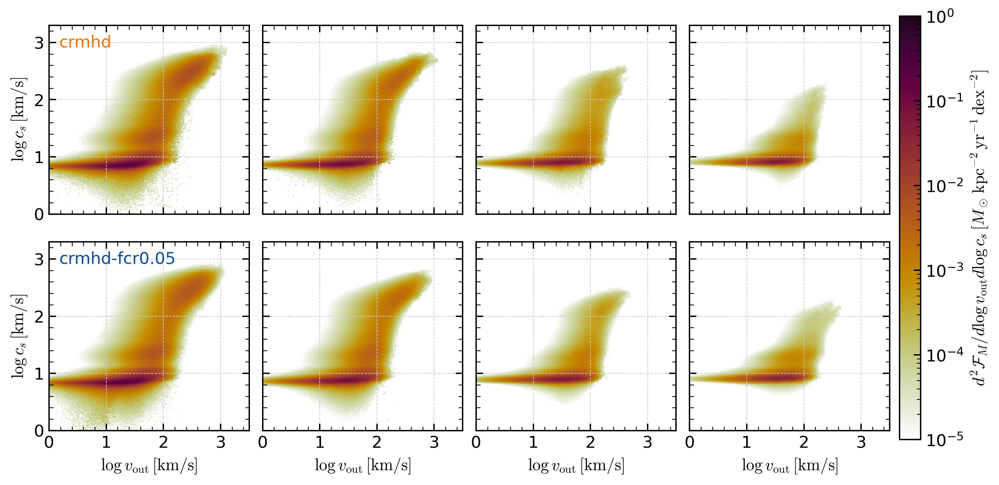

In [67]:
f=ps.plot_jointpdf(simgroup, group)

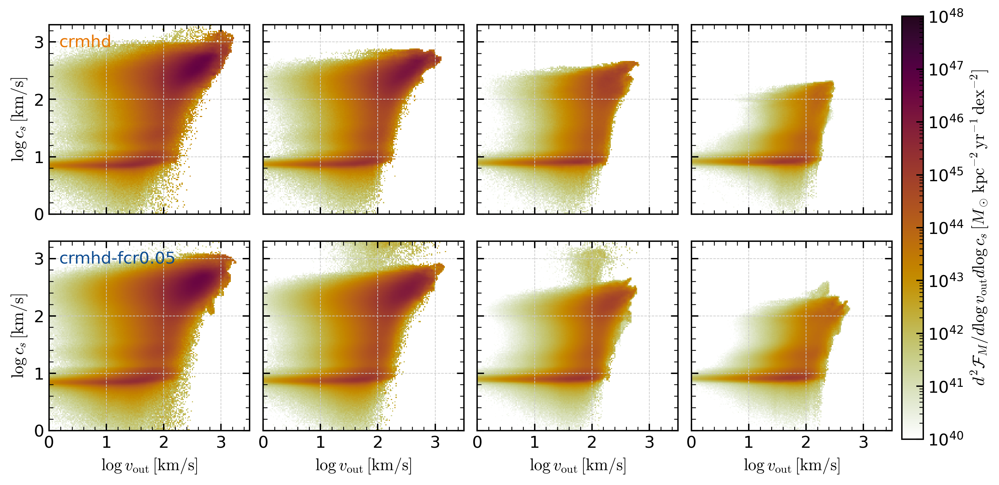

In [68]:
f=ps.plot_jointpdf(simgroup, group, flux="eflux")

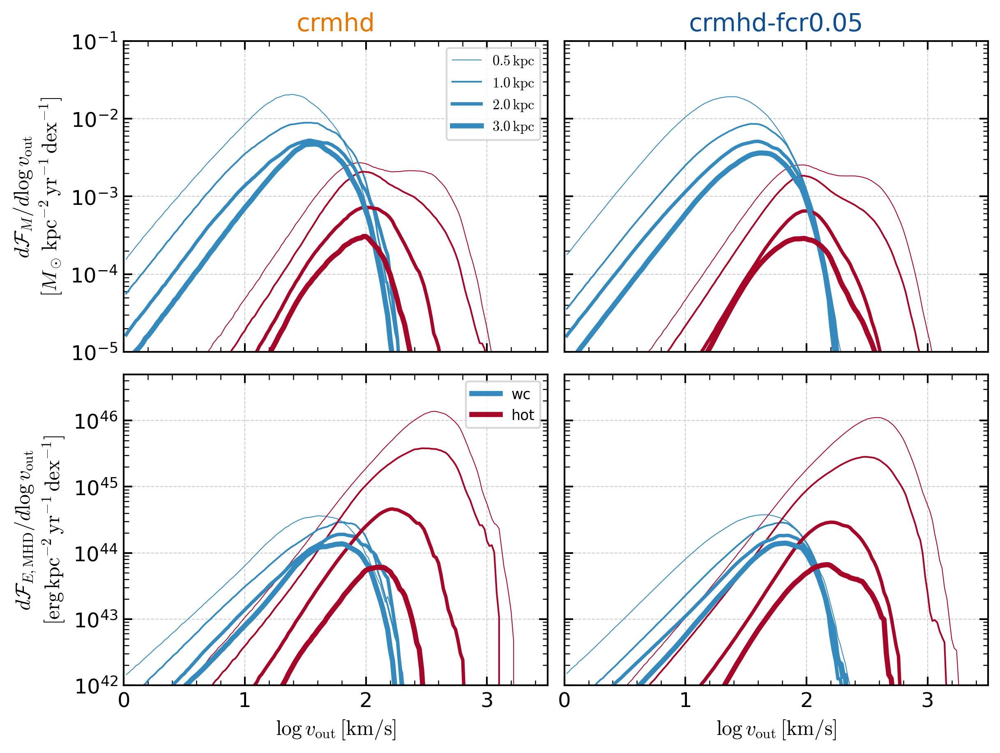

In [71]:
f=ps.plot_voutpdf(simgroup,group)

In [69]:
for m, s in sims.items():
    if s.options["cosmic_ray"]:
        load_velocity_pdfs(s, xf = "T")
        load_kappa_pdfs(s,xf="T",yf="sigma_para")

/home/changgoo/.conda/envs/pyathena/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/home/changgoo/.conda/envs/pyathena/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/home/changgoo/.conda/envs/pyathena/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/home/changgoo/.conda/envs/pyathena/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/home/changgoo/.conda/envs/pyathena/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,
/home/changgoo/.conda/envs/pyathena/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice enc

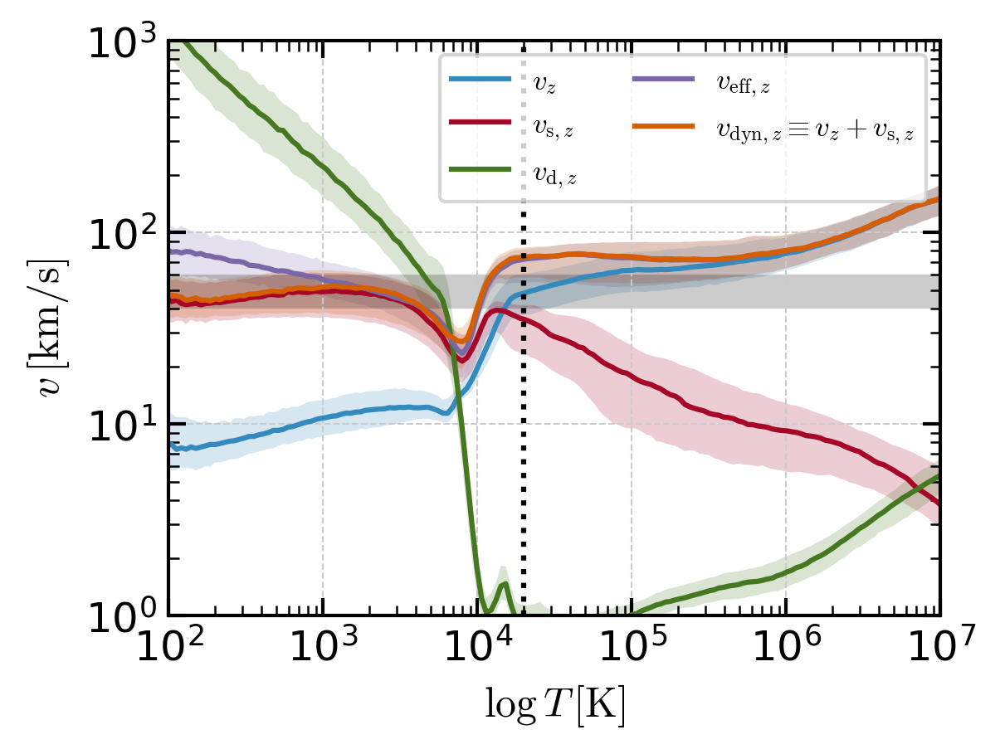

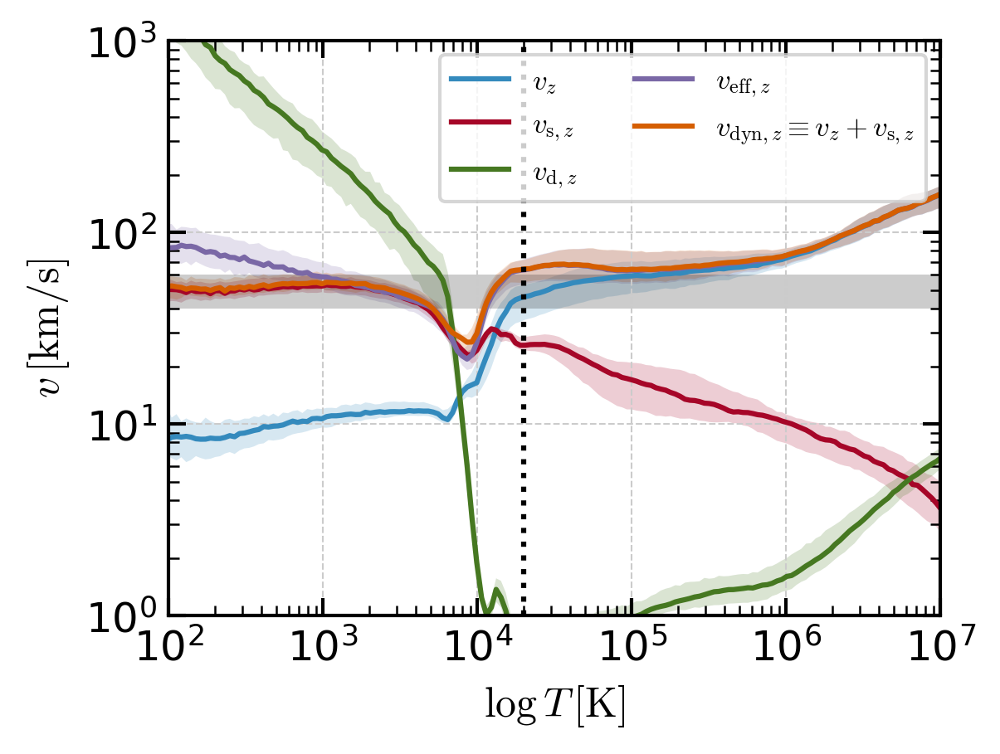

In [70]:
for m, s in sims.items():
    if s.options["cosmic_ray"]:
        ps.plot_velocity_T(s, m)